In [1]:
import matplotlib.pyplot as plt
import numpy
import pandas
import os
import cv2

import tensorflow as tf
from tensorflow import keras

In [2]:
data = pandas.read_csv('data/train_solution_bounding_boxes (1).csv')
data['xmin'] = data['xmin'].values / 676
data['ymin'] = data['ymin'].values / 380
data['xmax'] = data['xmax'].values / 676
data['ymax'] = data['ymax'].values / 380
names = data['image'].values
names = numpy.array(list(set(names)))
data.head()

,image,xmin,ymin,xmax,ymax
0,vid_4_1000.jpg,0.416064,0.492198,0.484805,0.587436
1,vid_4_10000.jpg,0.022431,0.492198,0.178003,0.622185
2,vid_4_10040.jpg,0.353835,0.465171,0.535456,0.622185
3,vid_4_10020.jpg,0.734443,0.453588,0.931983,0.609315
4,vid_4_10060.jpg,0.024602,0.490911,0.196093,0.627333


In [3]:
len(names)
size= (224, 224) # 7 676, 380
dx = 676/224
dy = 380/224

In [4]:
def gen():
    for name in names:
        sm_data = data[data['image'] == name]
        img = cv2.imread('data/training_images/' + name)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, size)
        
        out = sm_data.values
        out[:, 0] = 1
        while len(out) < 7:
            out = numpy.concatenate([out, numpy.zeros((1, 5))])
        yield img, out

dataset = tf.data.Dataset.from_generator(
    gen,
    output_signature=(
          tf.TensorSpec(shape=(size[0], size[1], 3), dtype=tf.int32),
          tf.TensorSpec(shape=(7, 5), dtype=tf.float32)),
)

def config(a, b):
    return a, b

dataset = dataset.map(config, num_parallel_calls=tf.data.AUTOTUNE).batch(64)

In [5]:
def build_model():
    model = keras.Sequential()
    model.add(keras.Input(shape=(size[0], size[1], 3)))
    model.add(keras.layers.Conv2D(16, (3, 3), padding='same', activation='relu'))
    model.add(keras.layers.Conv2D(16, (3, 3), padding='same', activation='relu'))
    model.add(keras.layers.Conv2D(16, (3, 3), padding='same', activation='relu'))
    model.add(keras.layers.MaxPooling2D((2, 2)))
    model.add(keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu'))
    model.add(keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu'))
    model.add(keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu'))
    model.add(keras.layers.MaxPooling2D((2, 2)))
    model.add(keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu'))
    model.add(keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu'))
    model.add(keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu'))
    model.add(keras.layers.MaxPooling2D((2, 2)))
    model.add(keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu'))
    model.add(keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu'))
    model.add(keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu'))
    model.add(keras.layers.MaxPooling2D((2, 2)))
    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(1024, activation='relu'))
    model.add(keras.layers.Dense(35, activation='linear'))
    
    inputs = keras.Input(shape=(size[0], size[1], 3))
    x = model(inputs)
    x = keras.layers.Reshape((7, 5))(x)
    conf = tf.keras.activations.sigmoid(x[..., :1])
    bbox = tf.keras.activations.sigmoid(x[..., 1:])
    out = keras.layers.concatenate([conf, bbox])
    
    model = keras.Model(inputs, out)
    return model

model = build_model()
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 sequential (Sequential)     (None, 35)                   2621661   ['input_2[0][0]']             
                                                          1                                       
                                                                                                  
 reshape (Reshape)           (None, 7, 5)                 0         ['sequential[0][0]']          
                                                                                                  
 tf.__operators__.getitem (  (None, 7, 1)                 0         ['reshape[0][0]']         

In [6]:
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.00001),
    loss='mse'
)
history = model.fit(dataset, epochs=200)

Epoch 1/200
6/6 [==============================] - 11s 714ms/step - loss: 0.1760
Epoch 2/200
6/6 [==============================] - 1s 157ms/step - loss: 0.0674
Epoch 3/200
6/6 [==============================] - 1s 158ms/step - loss: 0.0414
Epoch 4/200
6/6 [==============================] - 1s 157ms/step - loss: 0.0389
Epoch 5/200
6/6 [==============================] - 1s 159ms/step - loss: 0.0385
Epoch 6/200
6/6 [==============================] - 1s 156ms/step - loss: 0.0378
Epoch 7/200
6/6 [==============================] - 1s 159ms/step - loss: 0.0371
Epoch 8/200
6/6 [==============================] - 1s 158ms/step - loss: 0.0367
Epoch 9/200
6/6 [==============================] - 1s 158ms/step - loss: 0.0361
Epoch 10/200
6/6 [==============================] - 1s 157ms/step - loss: 0.0357
Epoch 11/200
6/6 [==============================] - 1s 154ms/step - loss: 0.0352
Epoch 12/200
6/6 [==============================] - 1s 157ms/step - loss: 0.0348
Epoch 13/200
6/6 [==================

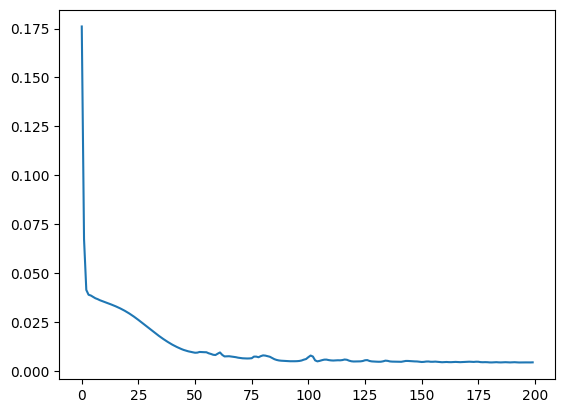

In [7]:
plt.plot(range(len(history.history['loss'])),(history.history['loss']))

2/2 [==============================] - 0s 6ms/step


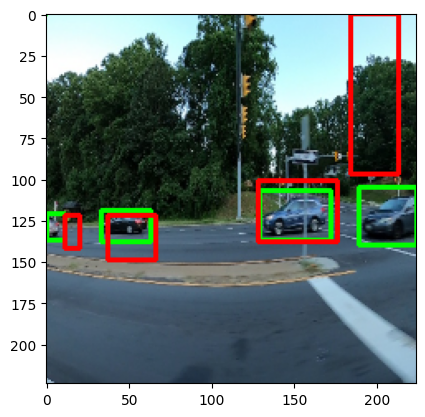

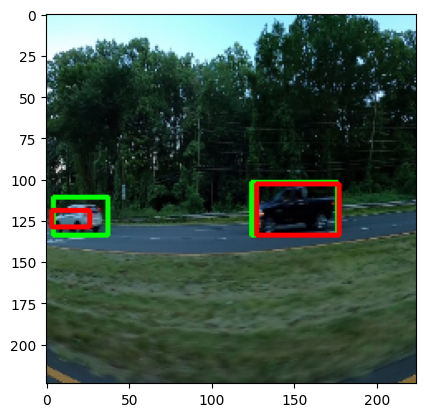

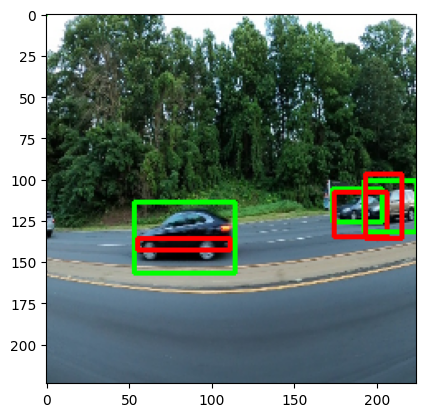

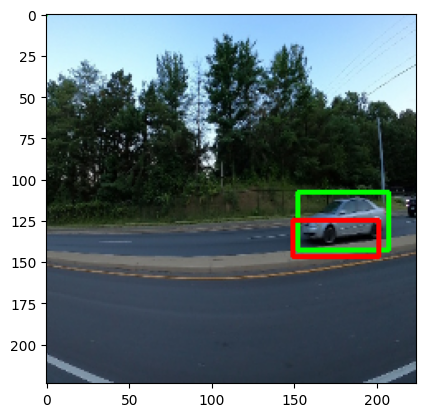

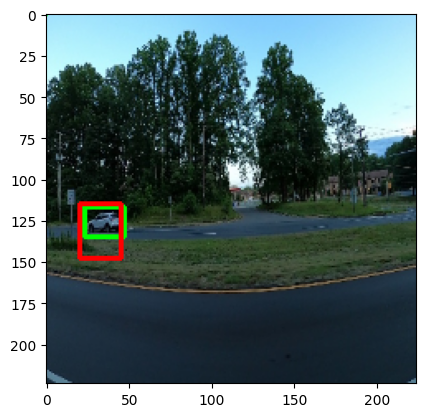

...

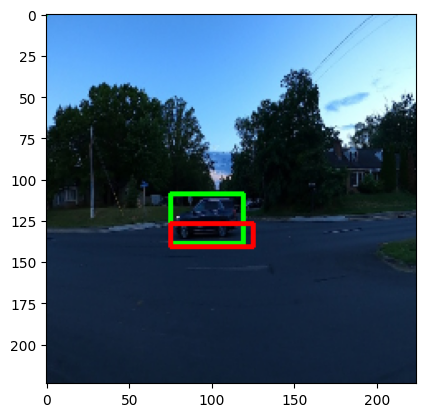

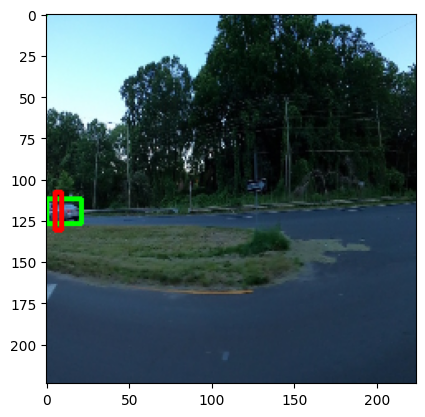

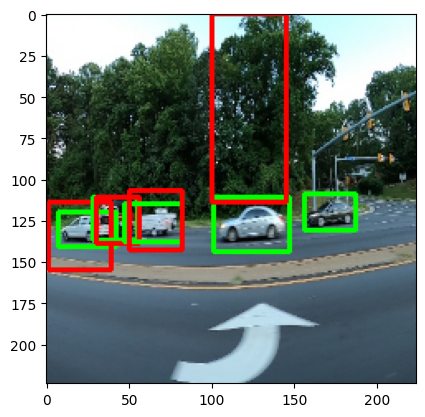

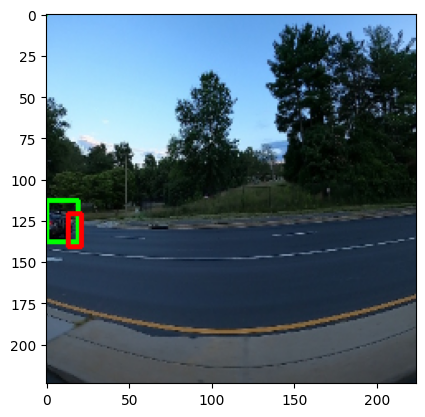

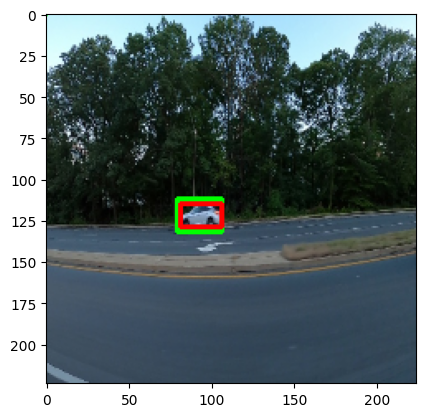

In [8]:
for imgs, labels in dataset.take(1):
    imgs = numpy.array(imgs)
    labels = numpy.array(labels)
    preds = model.predict(imgs)
    for i in range(len(imgs)):
        img = imgs[i]
        label = labels[i]
        # print(label)
        pred = preds[i]
        for j in range(7):
            _, x1, y1, x2, y2 = label[j]
            x1, y1, x2, y2 = numpy.array([x1*224, y1*224, x2*224, y2*224]).astype(int)
            img = cv2.rectangle(
                img,
                (x1, y1),
                (x2, y2),
                thickness=2,
                color=(0, 255, 0)
            )
            _, x1, y1, x2, y2 = pred[j]
            if _ > .4:
                x1, y1, x2, y2 = numpy.array([x1*224, y1*224, x2*224, y2*224]).astype(int)
                img = cv2.rectangle(
                    img,
                    (x1, y1),
                    (x2, y2),
                    thickness=2,
                    color=(255, 0, 0)
                )
        plt.imshow(img)
        plt.show()

1/1 [==============================] - 0s 200ms/step
2.0525138e-06 2.0923796e-08 1.6368954e-08 1.3329256e-08
2.0525138e-06 2.0923796e-08 1.6368954e-08 1.3329256e-08
2.0525138e-06 2.0923796e-08 1.6368954e-08 1.3329256e-08
2.0525138e-06 2.0923796e-08 1.6368954e-08 1.3329256e-08
2.0525138e-06 2.0923796e-08 1.6368954e-08 1.3329256e-08
2.0525138e-06 2.0923796e-08 1.6368954e-08 1.3329256e-08
2.0525138e-06 2.0923796e-08 1.6368954e-08 1.3329256e-08


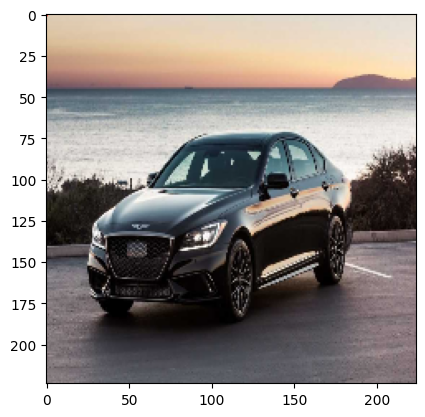

In [9]:
img = cv2.imread('img.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img, (224, 224))
preds = model.predict(numpy.array([img]))[0]
for i in range(7):
    _, x1, y1, x2, y2 = preds[j]
    print(x1, y1, x2, y2)
    if _ > .0:
        x1, y1, x2, y2 = numpy.array([x1*224, y1*224, x2*224, y2*224]).astype(int)
        img = cv2.rectangle(
            img,
            (x1, y1),
            (x2, y2),
            thickness=2,
            color=(255, 0, 0)
        )
plt.imshow(img)